### !pip install transformers==4.49.0 ultralytics


In [1]:
import cv2
import numpy as np
import torch
from PIL import Image
from transformers import AutoModelForCausalLM, AutoProcessor
from ultralytics.solutions.solutions import SolutionAnnotator
from ultralytics.utils.downloads import safe_download
from ultralytics.utils.plotting import Annotator, colors

In [3]:
model_id = "microsoft/Florence-2-large"

# Ensure the runtime is set to GPU in Colab.
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True, torch_dtype="auto").eval().cuda()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

pytorch_model.bin:   0%|          | 0.00/1.56G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/48.7k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [4]:
def inference(image, task_prompt, text_input=None):
    """
    Performs inference using the given image and task prompt.

    Args:
        image (PIL.Image or tensor): The input image for processing.
        task_prompt (str): The prompt specifying the task for the model.
        text_input (str, optional): Additional text input to refine the task prompt.

    Returns:
        dict: The model's processed response after inference.
    """
    # Combine task prompt with additional text input if provided
    prompt = task_prompt if text_input is None else task_prompt + text_input

    # Generate the input data for model processing from the given prompt and image
    inputs = processor(
        text=prompt,  # Text input for the model
        images=image,  # Image input for the model
        return_tensors="pt",  # Return PyTorch tensors
    ).to("cuda", torch.float16)  # Move inputs to GPU with float16 precision

    # Generate model predictions (token IDs)
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),  # Convert text input IDs to CUDA
        pixel_values=inputs["pixel_values"].cuda(),  # Convert image pixel values to CUDA
        max_new_tokens=1024,  # Set maximum number of tokens to generate
        early_stopping=False,  # Disable early stopping
        do_sample=False,  # Use deterministic inference
        num_beams=3,  # Set beam search width for better predictions
    )

    # Decode generated token IDs into text
    generated_text = processor.batch_decode(
        generated_ids,  # Generated token IDs
        skip_special_tokens=False,  # Retain special tokens in output
    )[0]  # Extract first result from batch

    # Post-process the generated text into a structured response
    parsed_answer = processor.post_process_generation(
        generated_text,  # Raw generated text
        task=task_prompt,  # Task type for post-processing
        image_size=(image.width, image.height),  # Original image dimensions for scaling output
    )

    return parsed_answer  # Return the final processed output

In [7]:
def read_image(filename=None):
    if filename is not None:
        image_name = filename
    else:
        image_name = "bus.jpg"  # or "zidane.jpg"

    # Download the image
    safe_download(f"https://github.com/ultralytics/assets/releases/download/v0.0.0/{image_name}")

    # Read the image using OpenCV and convert it into the PIL format
    return Image.fromarray(cv2.cvtColor(cv2.imread(f"{image_name}"), cv2.COLOR_BGR2RGB))

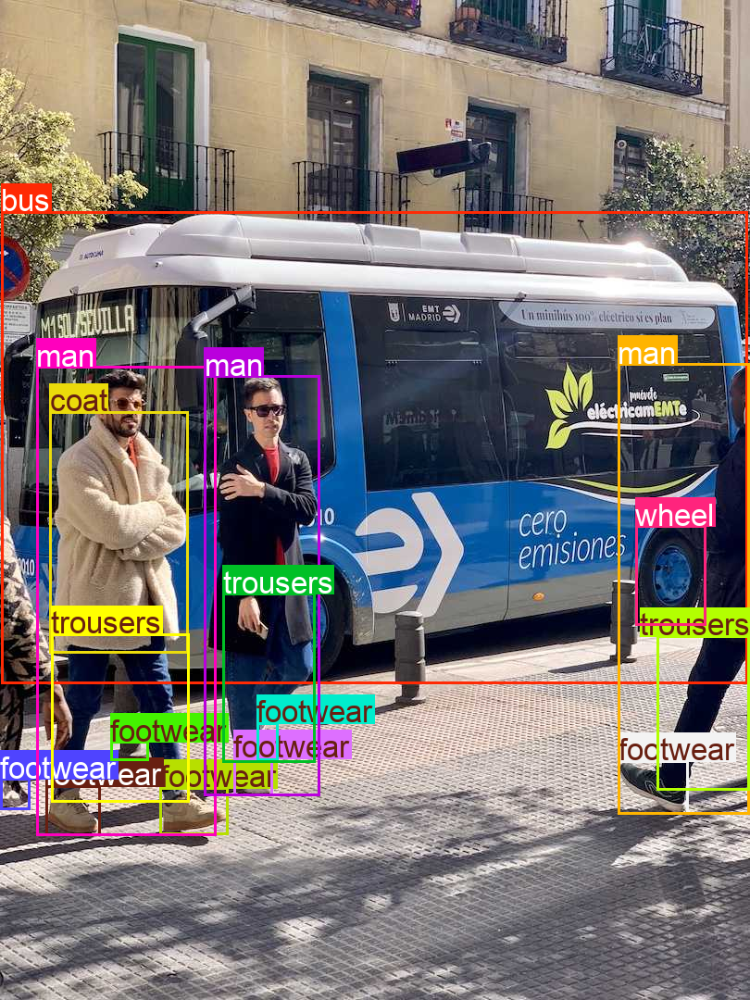

In [8]:
"""
# Result format 😀
{
    "<OD>": {
        "bboxes": [[x1, y1, x2, y2], ...],
        "labels": ["label1", "label2", ...]
    }
}
"""

task_prompt = "<OD>"
image = read_image()

results = inference(image, task_prompt)["<OD>"]

# Plot the results on an image
annotator = Annotator(image)  # initialize Ultralytics annotator

for idx, (box, label) in enumerate(zip(results["bboxes"], results["labels"])):
    annotator.box_label(box, label=label, color=colors(idx, True))

Image.fromarray(annotator.result())  # display the output

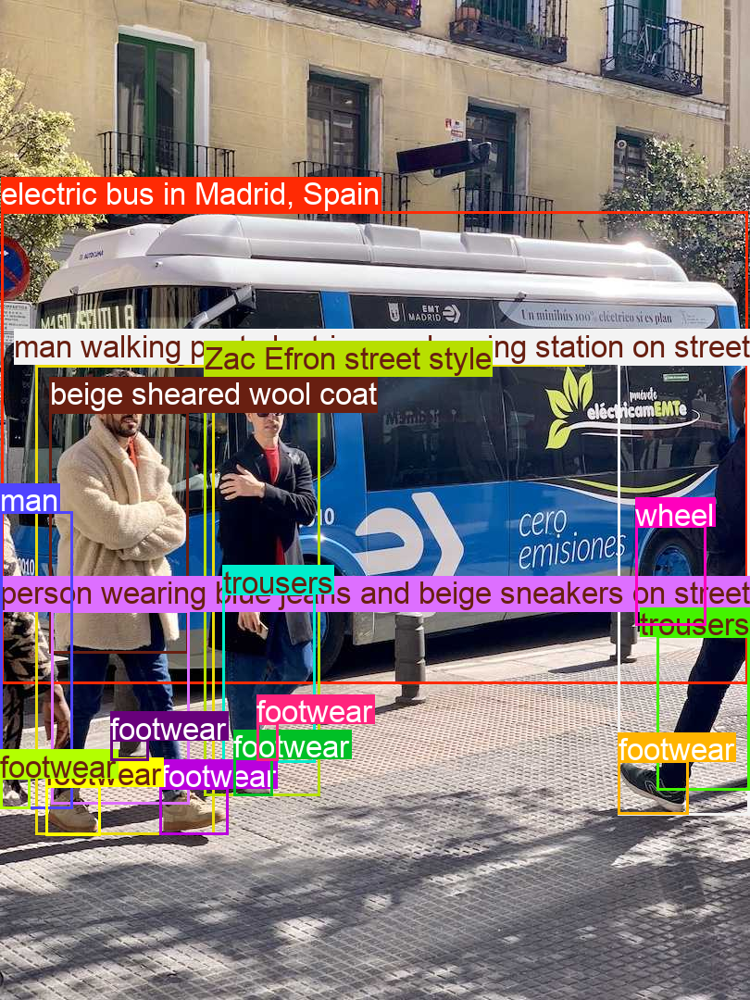

In [9]:
"""
# Result format 😀
{
    "<DENSE_REGION_CAPTION>": {
        "bboxes": [[x1, y1, x2, y2], ...],
        "labels": ["label1", "label2", ...]
    }
}
"""

task_prompt = "<DENSE_REGION_CAPTION>"
image = read_image()

results = inference(image, task_prompt)["<DENSE_REGION_CAPTION>"]

# Plot the results on an image
annotator = Annotator(image)  # initialize Ultralytics annotator

for idx, (box, label) in enumerate(zip(results["bboxes"], results["labels"])):
    annotator.box_label(box, label=label, color=colors(idx, True))

Image.fromarray(annotator.result())  # display the output

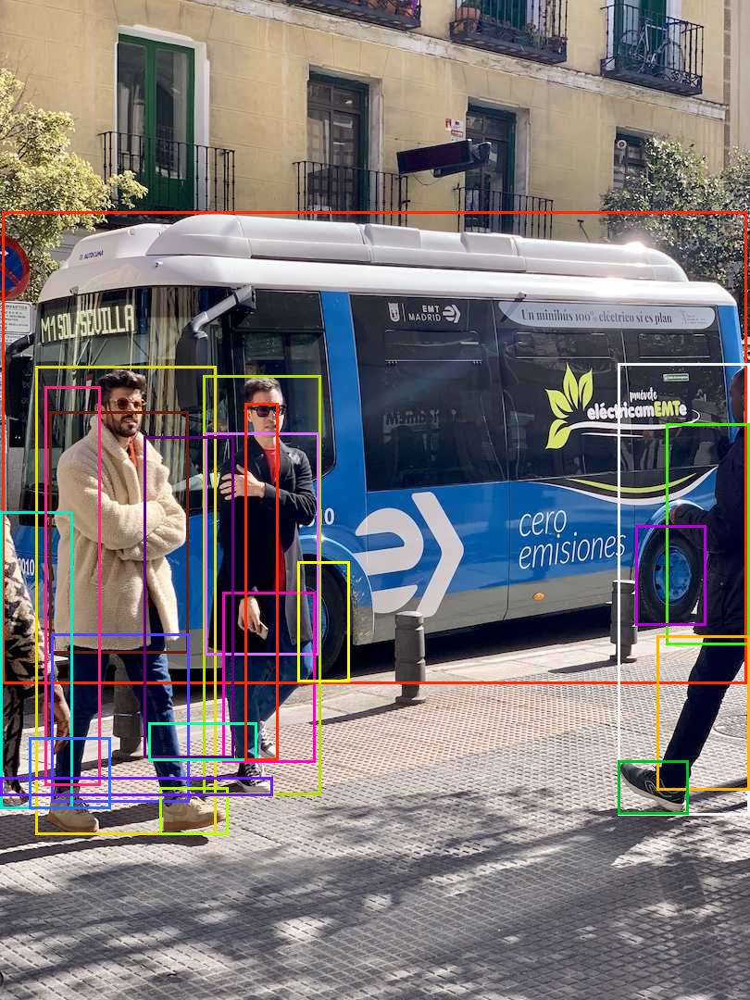

In [10]:
"""
# Results format 🎉
{
    "<REGION_PROPOSAL>": {
        "bboxes": [[x1, y1, x2, y2], ...],
        "labels": ["label1", "label2", ...]
    }
}
"""

task_prompt = "<REGION_PROPOSAL>"
image = read_image()

results = inference(image, task_prompt)["<REGION_PROPOSAL>"]

# Plot the results on an image
annotator = Annotator(image)  # initialize Ultralytics annotator
for idx, box in enumerate(results["bboxes"]):
    x1, y1, x2, y2 = box
    if x1 > x2:
        x1, x2 = x2, x1  # Swap x-coordinates if needed
    if y1 > y2:
        y1, y2 = y2, y1  # Swap y-coordinates if needed

    # Update the bounding box correctly
    annotator.box_label([x1, y1, x2, y2], color=colors(idx, True))

Image.fromarray(annotator.result())  # display the output

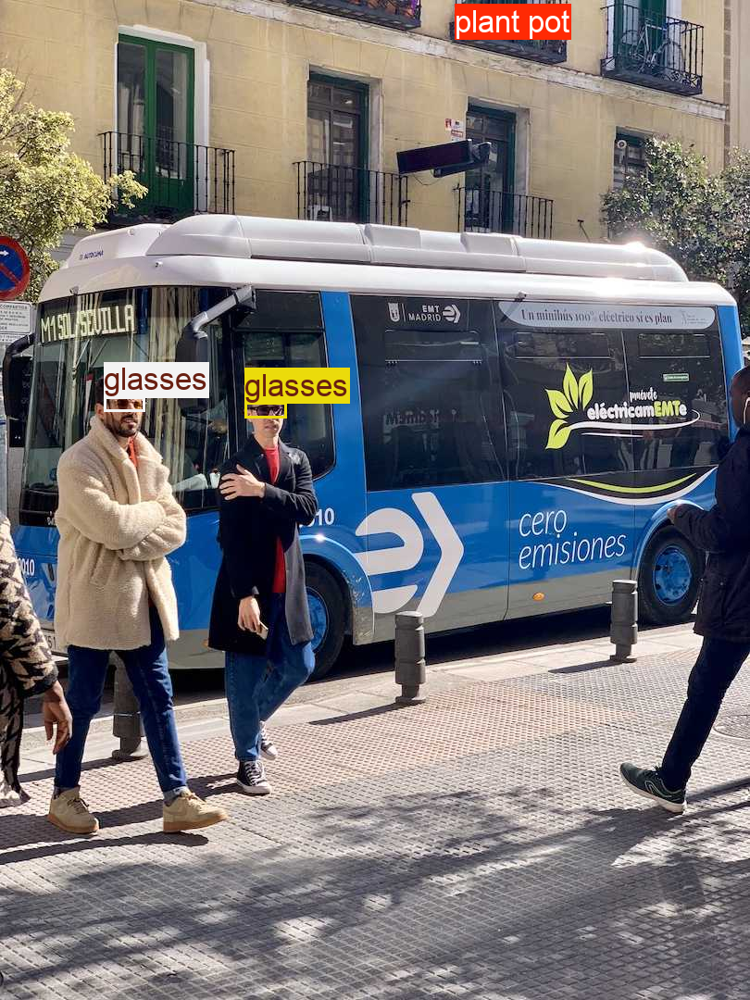

In [12]:
"""
# Results format: 🚀
{
    "<CAPTION_TO_PHRASE_GROUNDING>": {
        "bboxes": [[x1, y1, x2, y2], ...],
        "labels": ["label1", "label2", ...]
    }
}
"""

task_prompt = "<CAPTION_TO_PHRASE_GROUNDING>"
image = read_image()

results = inference(image, task_prompt, text_input="plant pot, glasses")["<CAPTION_TO_PHRASE_GROUNDING>"]

# Plot the results on an image
annotator = Annotator(image)  # initialize Ultralytics annotator

for idx, (box, label) in enumerate(zip(results["bboxes"], results["labels"])):
    annotator.box_label(box, label=label, color=colors(idx, True))

Image.fromarray(annotator.result())  # display the output

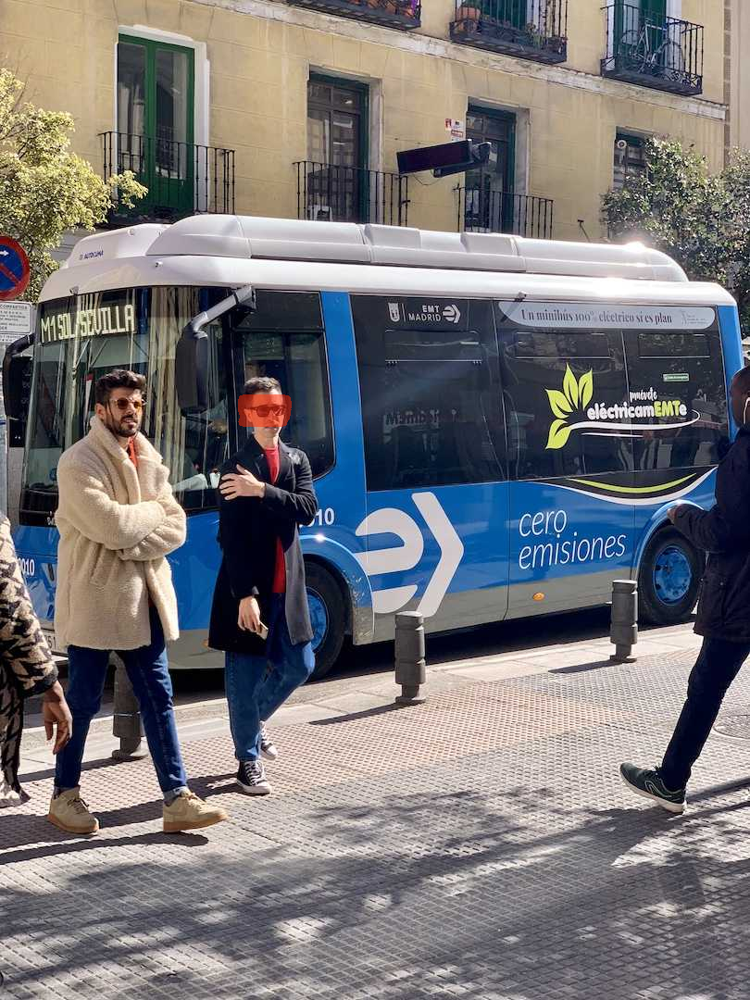

In [14]:
"""
# Results format 😃

# one object is represented by a list of polygons. each polygon is [x1, y1, x2, y2, ..., xn, yn]
{
    "<REFERRING_EXPRESSION_SEGMENTATION>": {
        {'Polygons': [[[polygon]], ...],
        "labels": ["label1", "label2", ...]
    }
}
"""

task_prompt = "<REFERRING_EXPRESSION_SEGMENTATION>"
image = read_image()

results = inference(image, task_prompt, text_input="glasses")[
    "<REFERRING_EXPRESSION_SEGMENTATION>"
]

# segmentation mask function required the numpy array image, not PIL based image.
annotator = SolutionAnnotator(np.array(image, dtype=np.uint8))

for idx, (polygons, label) in enumerate(zip(results["polygons"], results["labels"])):
    for polygon in polygons:
        polygon = np.array(polygon).reshape(-1, 2)

        if len(polygon) < 3:
            print("Invalid polygon:", polygon)
            continue

        annotator.segmentation_mask(polygon, label=label, mask_color=colors(idx, True))

Image.fromarray(annotator.result())  # display the output

# visual region segmentation using coordinates

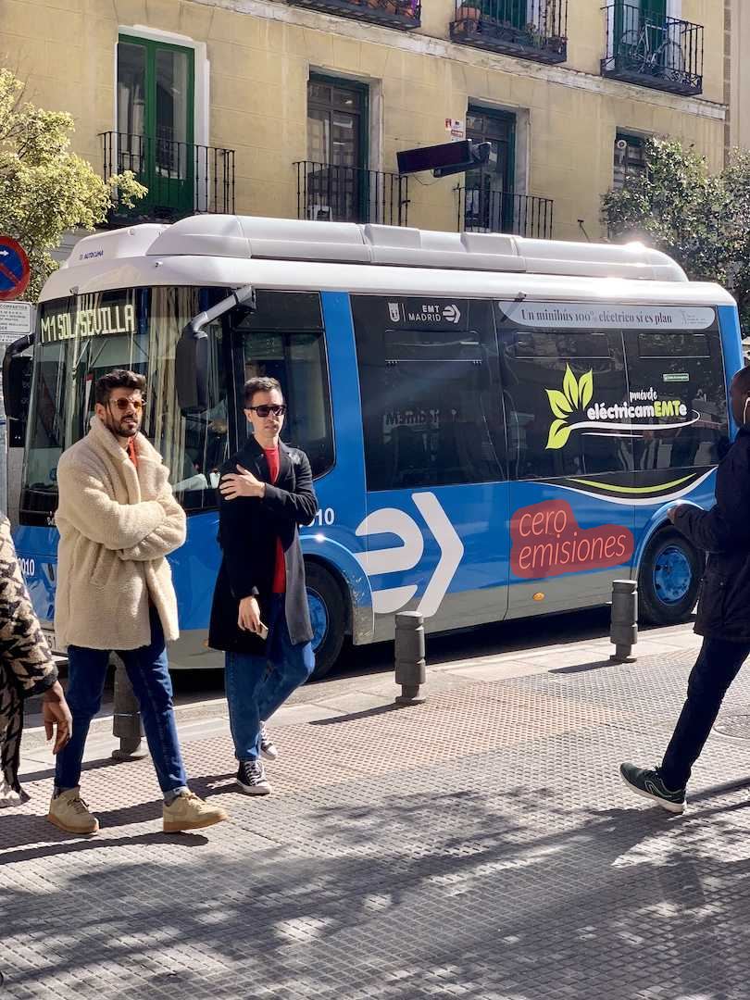

In [15]:
task_prompt = "<REGION_TO_SEGMENTATION>"
image = read_image()

results = inference(
    image, task_prompt, text_input="[3.8328723907470703, 229.35601806640625,796.2098999023438, 728.4313354492188]"
)["<REGION_TO_SEGMENTATION>"]

# segmentation mask function required the numpy array image, not PIL based image.
annotator = SolutionAnnotator(np.array(image, dtype=np.uint8))

for idx, (polygons, label) in enumerate(zip(results["polygons"], results["labels"])):
    for _polygon in polygons:
        _polygon = np.array(_polygon).reshape(-1, 2)

        if len(_polygon) < 3:
            print("Invalid polygon:", _polygon)
            continue

        annotator.segmentation_mask(_polygon, label=label, mask_color=colors(idx, True))

Image.fromarray(annotator.result())  # display the output

# Open vocabulary

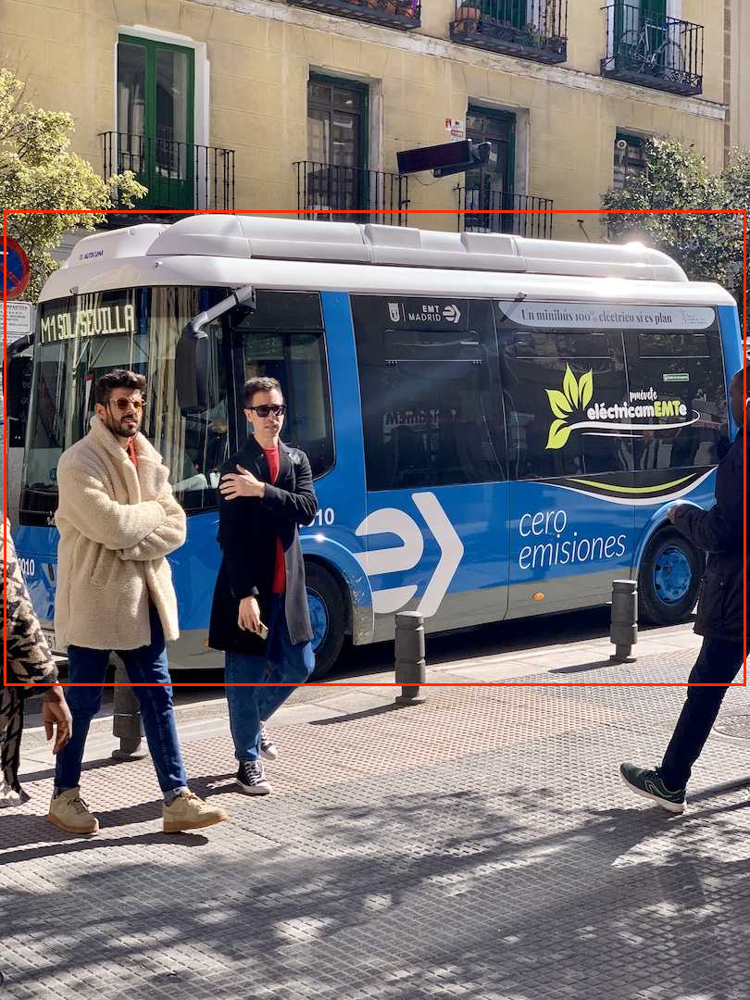

In [17]:
"""
# Results format 😀

{ '<OPEN_VOCABULARY_DETECTION>':

      {'bboxes': [[x1, y1, x2, y2], [x1, y1, x2, y2], ...]],
      'bboxes_labels': ['label_1', 'label_2', ..],
      'polygons': [[[x1, y1, x2, y2, ..., xn, yn], [x1, y1, ..., xn, yn]], ...],
      'polygons_labels': ['label_1', 'label_2', ...]
      }
}
"""

task_prompt = "<OPEN_VOCABULARY_DETECTION>"
image = read_image()

results = inference(image, task_prompt)["<OPEN_VOCABULARY_DETECTION>"]

# segmentation mask function required the numpy array image, not PIL based image.
annotator = Annotator(image)

for idx, (box, label) in enumerate(zip(results["bboxes"], results["bboxes_labels"])):
    annotator.box_label(box, color=colors(idx, True), label=label)

Image.fromarray(annotator.result())  # display the output